In [ ]:
!pip install matplotlib pytorch-grad-cam ultralytics scikit-learn pandas pillow

In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from ultralytics import YOLO
from sklearn.metrics import average_precision_score, precision_recall_curve
import os
import pandas as pd
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

base_path = '/content/drive/MyDrive/Gradient Research Lab/visdrone_project'
val_images_path = os.path.join(base_path, 'dataset/images/val')
output_folder = os.path.join(base_path, 'output/heatmaps')
os.makedirs(output_folder, exist_ok=True)

yolo_model = YOLO('/content/drive/MyDrive/Gradient Research Lab/visdrone_project/dataset/best.pt')

resnet = models.resnet50(weights='IMAGENET1K_V1')
# resnet.eval()

In [ ]:
class GradCAMProcessor:
    def __init__(self, model, target_layer='layer4'):
        self.model = model
        self.target_layers = [getattr(model, target_layer)]
        self.grad_cam_pp = GradCAMPlusPlus(model=model, target_layers=self.target_layers)
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def generate_heatmap(self, image_path):
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Prepare image for ResNet
        pil_image = Image.fromarray(image_rgb)
        input_tensor = self.transform(pil_image).unsqueeze(0)

        # Generate heatmap - using multiple targets for better activation
        targets = [ClassifierOutputTarget(i) for i in [281, 285, 829, 511]]  # cat, car, streetcar, container ship
        grayscale_cam = self.grad_cam_pp(input_tensor=input_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]

        # Resize heatmap to original image size
        heatmap_resized = cv2.resize(grayscale_cam, (image_rgb.shape[1], image_rgb.shape[0]))

        return grayscale_cam, heatmap_resized, image_rgb, image

In [ ]:
def crop_roi_fixed_size(image, heatmap, crop_size=416):
    if len(heatmap.shape) == 3:
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_RGB2GRAY)

    # Apply Gaussian blur to smooth heatmap
    heatmap_smooth = cv2.GaussianBlur(heatmap, (15, 15), 0)

    # Find weighted center of mass instead of simple max
    threshold = np.percentile(heatmap_smooth, 80)  # Top 20% activation
    heatmap_binary = (heatmap_smooth > threshold).astype(np.uint8)

    # Find contours to get the largest activation region
    contours, _ = cv2.findContours(heatmap_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        h, w = image.shape[:2]
        center_y, center_x = h // 2, w // 2
    else:
        # Get the largest contour
        largest_contour = max(contours, key=cv2.contourArea)
        M = cv2.moments(largest_contour)
        if M["m00"] != 0:
            center_x = int(M["m10"] / M["m00"])
            center_y = int(M["m01"] / M["m00"])
        else:
            y, x = np.where(heatmap_binary == 1)
            center_y, center_x = np.mean(y), np.mean(x)

    # Fixed crop size for consistency
    half_crop = crop_size // 2
    h, w = image.shape[:2]

    # Ensure crop stays within image bounds
    x1 = max(0, min(int(center_x - half_crop), w - crop_size))
    y1 = max(0, min(int(center_y - half_crop), h - crop_size))
    x2 = min(w, x1 + crop_size)
    y2 = min(h, y1 + crop_size)

    # Adjust if crop is smaller than desired
    if (x2 - x1) < crop_size:
        x1 = max(0, x2 - crop_size)
    if (y2 - y1) < crop_size:
        y1 = max(0, y2 - crop_size)

    cropped_image = image[y1:y2, x1:x2]

    # Resize to exact crop_size if needed
    if cropped_image.shape[:2] != (crop_size, crop_size):
        cropped_image = cv2.resize(cropped_image, (crop_size, crop_size))

    crop_info = {'x1': x1, 'y1': y1, 'x2': x2, 'y2': y2, 'center_x': center_x, 'center_y': center_y}
    return cropped_image, crop_info

In [ ]:
def calculate_comprehensive_metrics(results, ground_truths=None):
    metrics = {}

    if len(results) == 0:
        return {'AP': 0.0, 'mAP': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'detections': 0}

    # Extract detection data
    boxes = results[0].boxes.xyxy.cpu().numpy() if results[0].boxes is not None else []
    scores = results[0].boxes.conf.cpu().numpy() if results[0].boxes is not None else []
    classes = results[0].boxes.cls.cpu().numpy() if results[0].boxes is not None else []

    if len(boxes) == 0:
        return {'AP': 0.0, 'mAP': 0.0, 'precision': 0.0, 'recall': 0.0, 'f1': 0.0, 'detections': 0}

    if ground_truths is None:
        gt_binary = [1] * len(scores)
    else:
        gt_binary = ground_truths

    # Calculate metrics
    if len(gt_binary) == len(scores):
        ap = average_precision_score(gt_binary, scores) if len(set(gt_binary)) > 1 else np.mean(scores)
    else:
        ap = np.mean(scores)

    # Additional metrics
    high_conf_detections = np.sum(scores > 0.5)
    avg_confidence = np.mean(scores)

    metrics = {
        'AP': ap,
        'mAP': ap,
        'precision': avg_confidence,
        'recall': min(1.0, high_conf_detections / max(1, len(scores))),
        'f1': 2 * avg_confidence * min(1.0, high_conf_detections / max(1, len(scores))) /
              (avg_confidence + min(1.0, high_conf_detections / max(1, len(scores))) + 1e-8),
        'detections': len(boxes),
        'avg_confidence': avg_confidence,
        'high_conf_detections': high_conf_detections
    }

    return metrics

class_mapping = {
    0: "pedestrian", 1: "people", 2: "bicycle", 3: "car", 4: "van", 5: "truck",
    6: "tricycle", 7: "awning-tricycle", 8: "bus", 9: "motor", 10: "others"
}


In [ ]:
def detect_on_heatmaps(image_paths):
    all_metrics = []

    for idx, image_path in enumerate(image_paths):
        print(f"Processing image {idx+1}/{len(image_paths)}: {os.path.basename(image_path)}")

        try:
            # Generate heatmap
            grayscale_cam, heatmap_resized, image_rgb, original_bgr = grad_cam_processor.generate_heatmap(image_path)

            # Crop ROI with fixed size
            cropped_roi, crop_info = crop_roi_fixed_size(original_bgr, heatmap_resized, crop_size=416)

            # Perform YOLO detection on cropped image
            results = yolo_model(cropped_roi)

            # Calculate comprehensive metrics
            metrics = calculate_comprehensive_metrics(results)
            metrics['image'] = os.path.basename(image_path)
            metrics['crop_center_x'] = crop_info['center_x']
            metrics['crop_center_y'] = crop_info['center_y']

            all_metrics.append(metrics)

            # Save outputs
            output_name = os.path.splitext(os.path.basename(image_path))[0]

            # Save heatmap
            heatmap_colored = cv2.applyColorMap((heatmap_resized * 255).astype(np.uint8), cv2.COLORMAP_JET)
            cv2.imwrite(f"{output_folder}/{output_name}_heatmap.jpg", heatmap_colored)

            # Save cropped ROI
            cv2.imwrite(f"{output_folder}/{output_name}_cropped.jpg", cropped_roi)

            # Generate and save visualization
            plot_results_improved(image_rgb, heatmap_resized, cropped_roi, results, output_name, crop_info)

        except Exception as e:
            print(f"Error processing {os.path.basename(image_path)}: {str(e)}")
            continue

    return all_metrics

Processing 10 images...
Processing image 1/10: 9999994_00000_d_0000069.jpg

0: 640x640 3 cars, 733.6ms
Speed: 5.2ms preprocess, 733.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


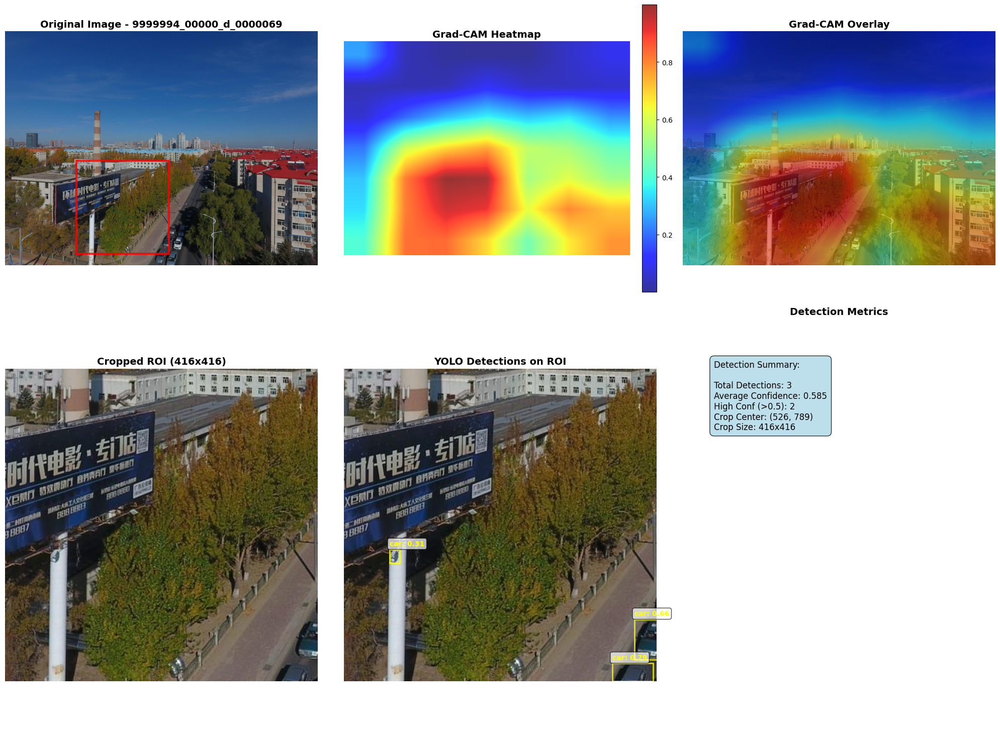

Processing image 2/10: 9999953_00000_d_0000220.jpg

0: 640x640 (no detections), 215.6ms
Speed: 5.0ms preprocess, 215.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


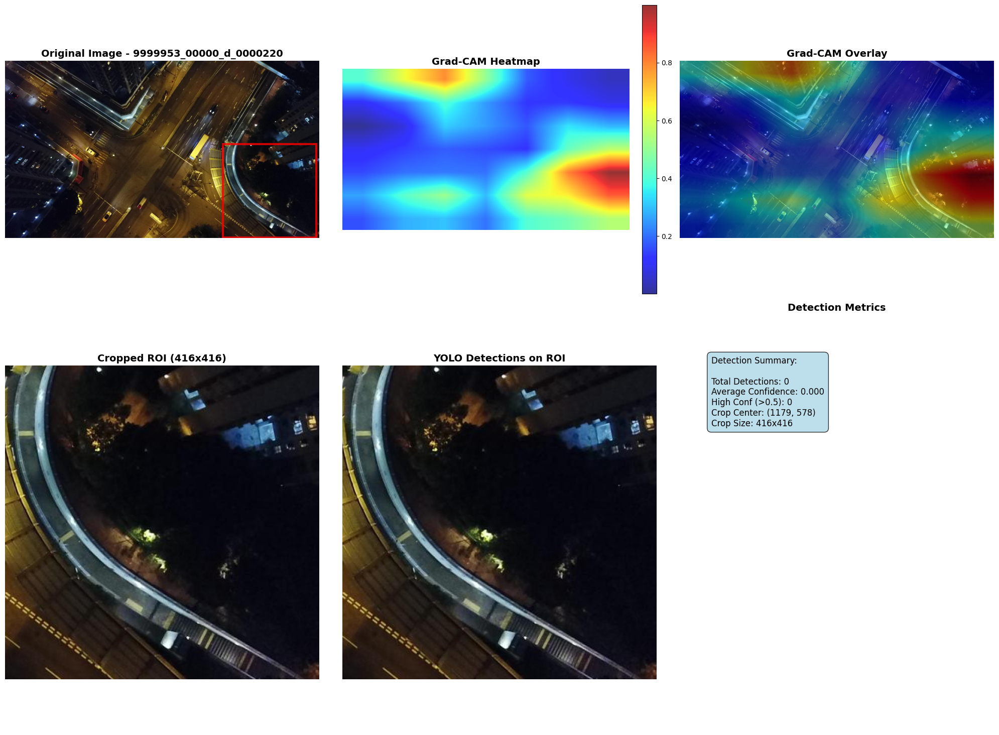

Processing image 3/10: 9999966_00000_d_0000029.jpg

0: 640x640 15 pedestrians, 1 motor, 224.2ms
Speed: 7.5ms preprocess, 224.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


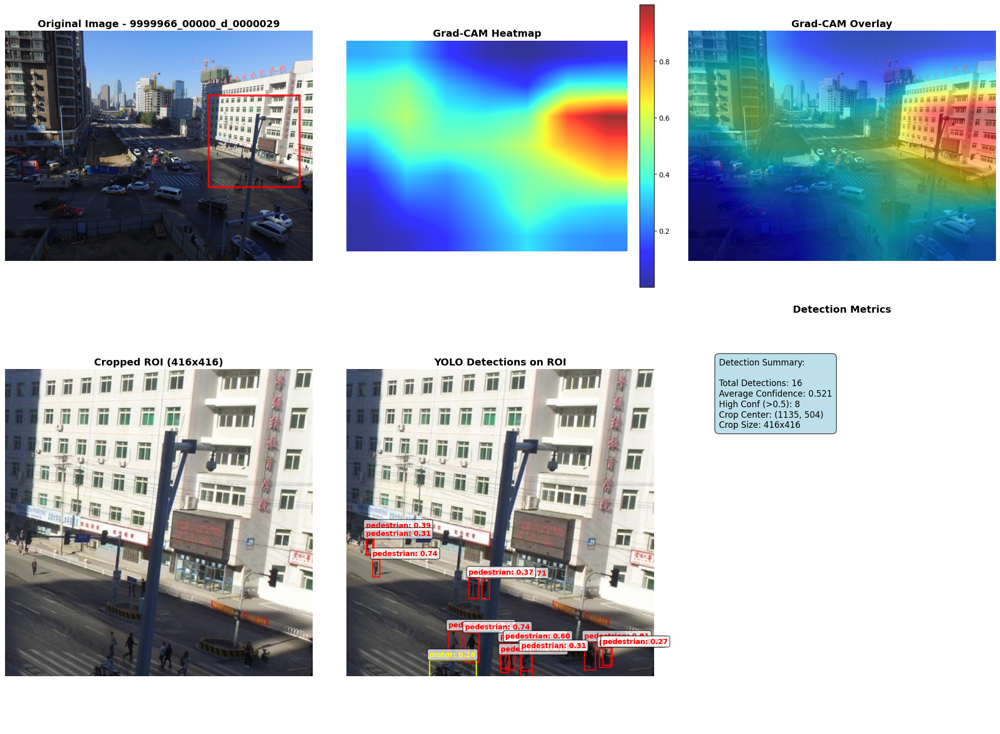

Processing image 4/10: 9999998_00286_d_0000239.jpg

0: 640x640 1 pedestrian, 5 cars, 2 vans, 1 truck, 241.0ms
Speed: 4.9ms preprocess, 241.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


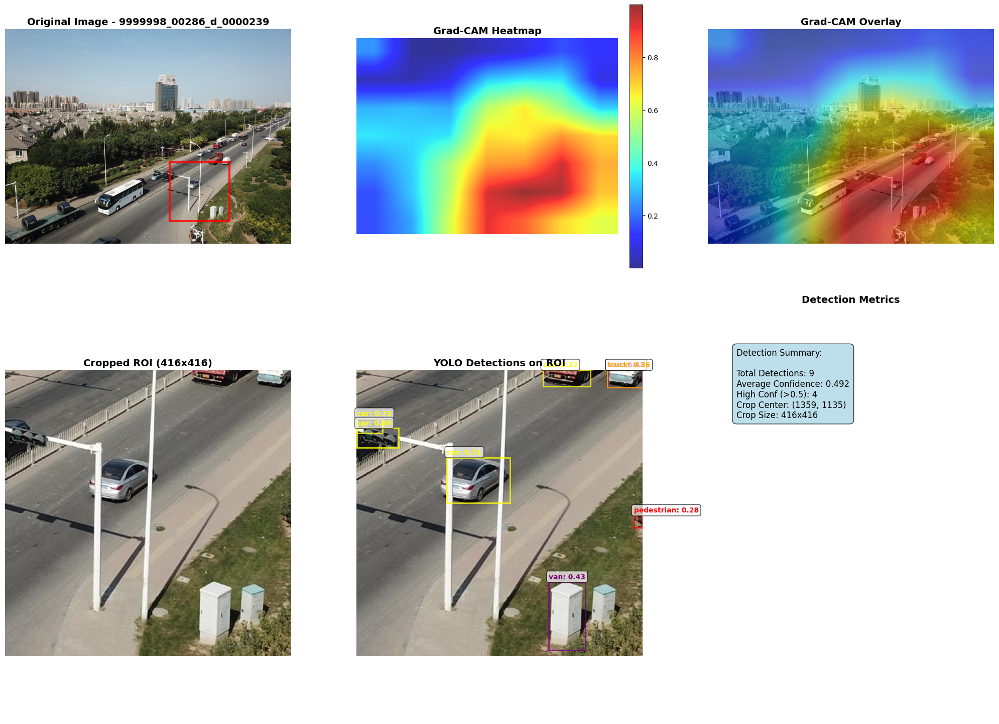

Processing image 5/10: 9999943_00000_d_0000065.jpg

0: 640x640 4 pedestrians, 2 cars, 2 vans, 1 motor, 256.3ms
Speed: 7.4ms preprocess, 256.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


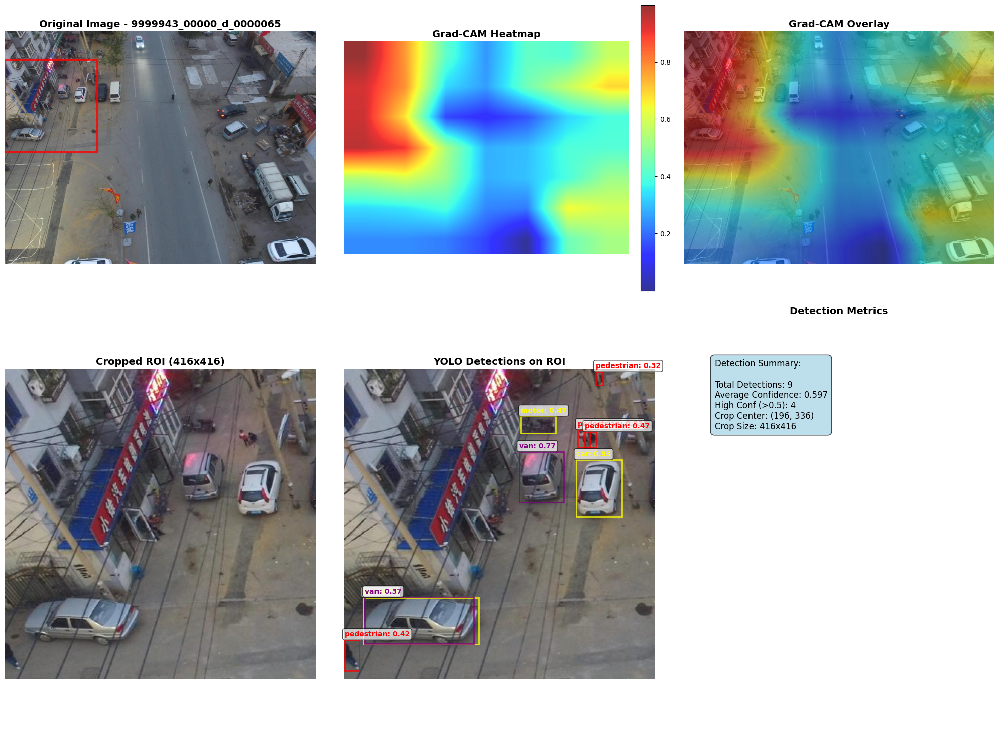

Processing image 6/10: 9999955_00000_d_0000261.jpg

0: 640x640 10 pedestrians, 271.6ms
Speed: 6.5ms preprocess, 271.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


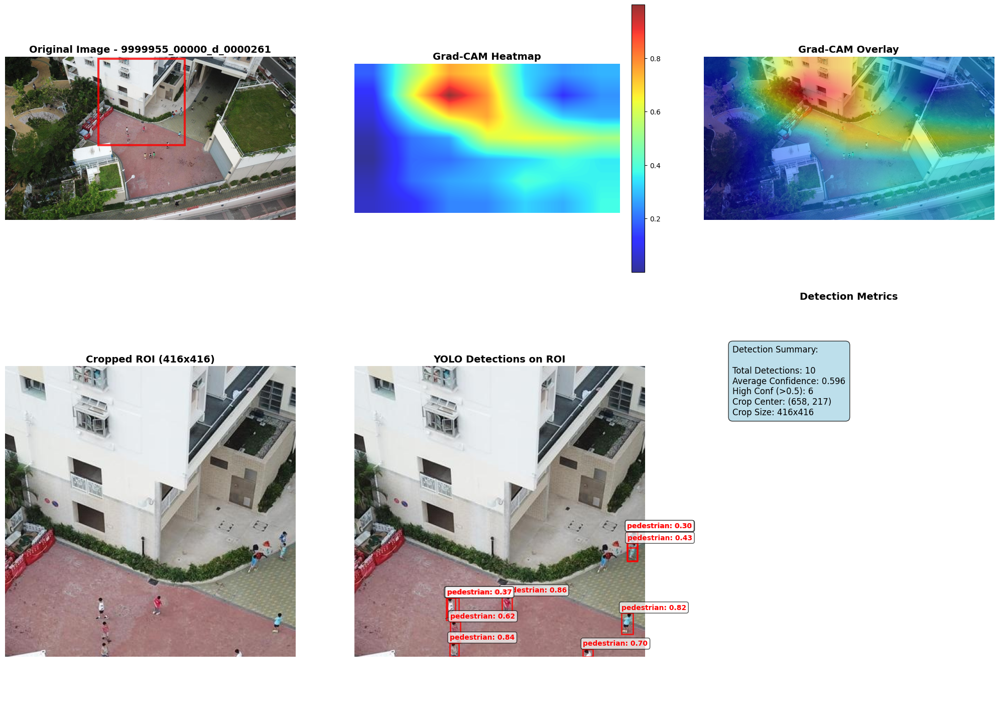

Processing image 7/10: 9999960_00000_d_0000061.jpg

0: 640x640 4 cars, 1 truck, 305.5ms
Speed: 5.0ms preprocess, 305.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


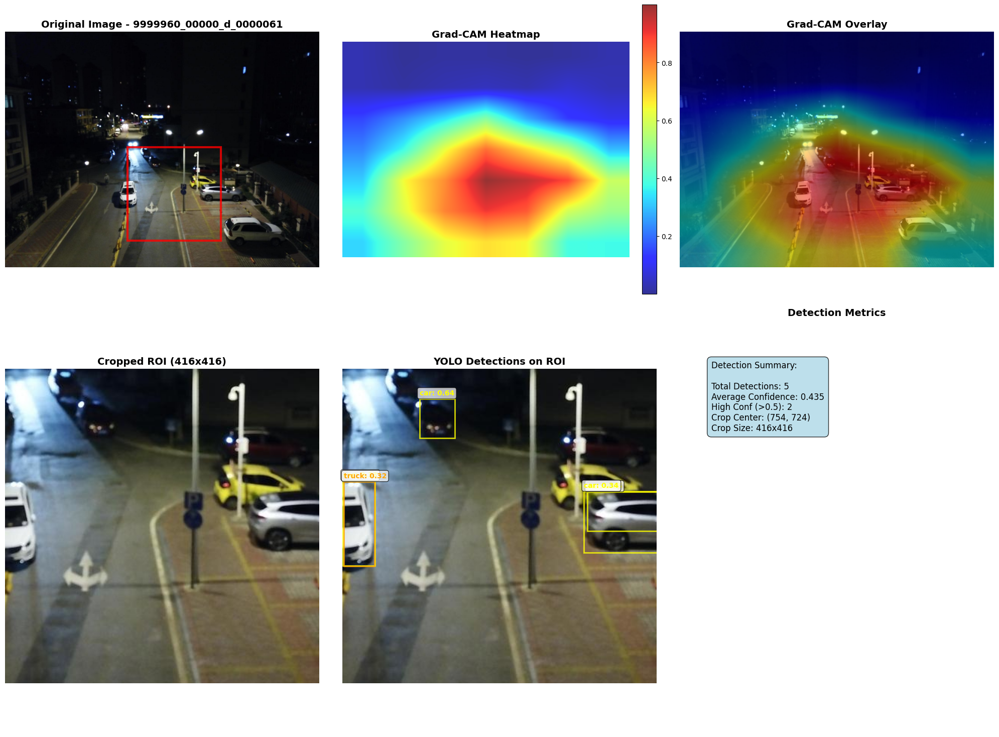

Processing image 8/10: 9999966_00000_d_0000082.jpg

0: 640x640 7 pedestrians, 1 car, 357.9ms
Speed: 5.1ms preprocess, 357.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


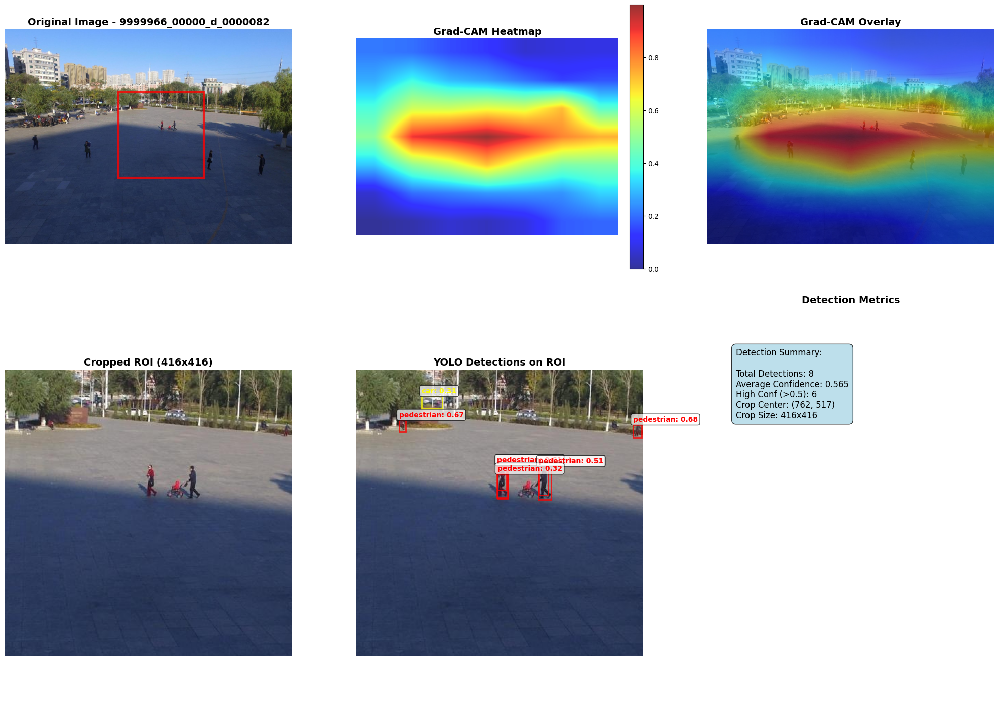

Processing image 9/10: 9999998_00388_d_0000340.jpg

0: 640x640 2 cars, 295.7ms
Speed: 5.7ms preprocess, 295.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


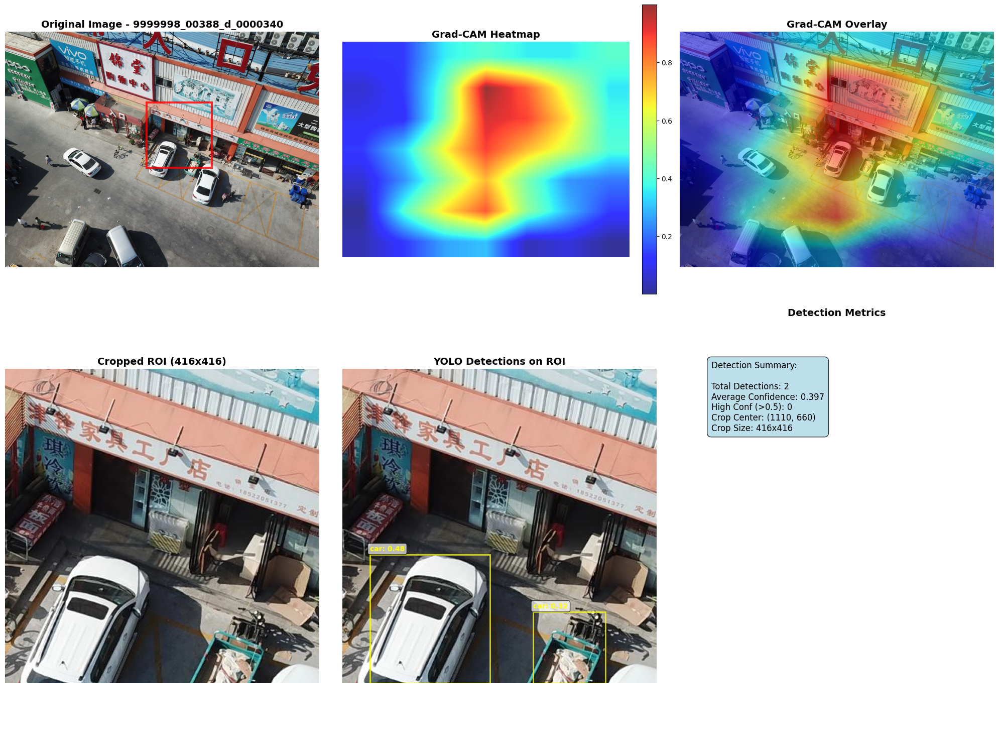

Processing image 10/10: 9999965_00000_d_0000005.jpg

0: 640x640 9 cars, 5 vans, 1 truck, 719.5ms
Speed: 16.0ms preprocess, 719.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


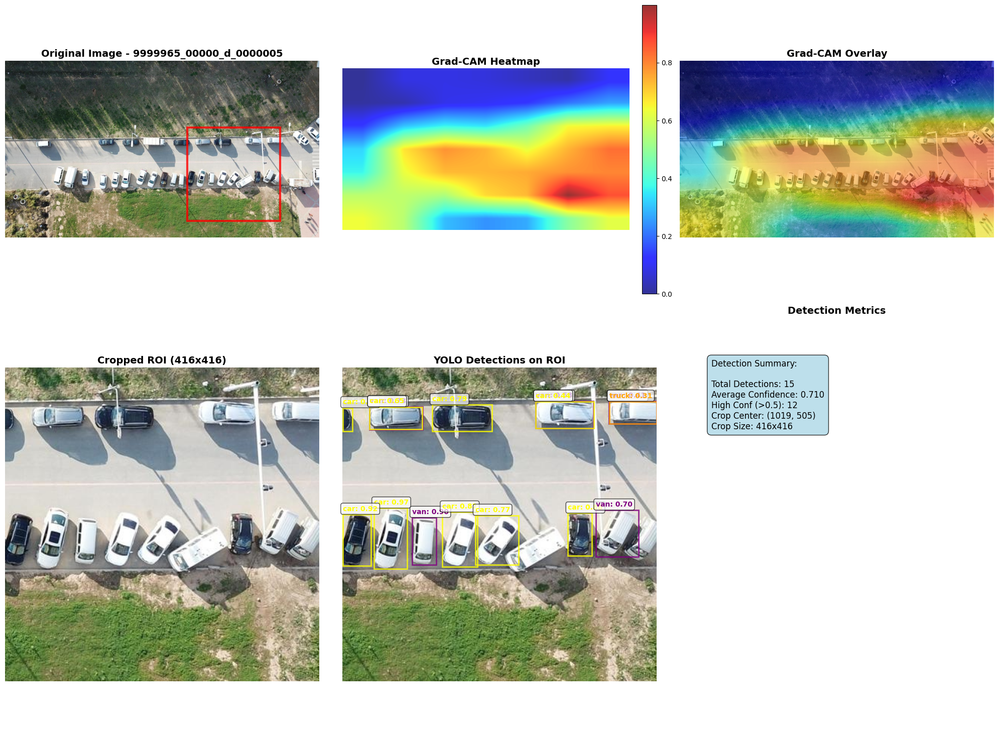


COMPREHENSIVE EVALUATION METRICS

Detailed Metrics per Image:
       AP     mAP  precision  recall      f1  detections  avg_confidence  \
0  0.5846  0.5846     0.5846  0.6667  0.6229           3          0.5846   
1  0.0000  0.0000     0.0000  0.0000  0.0000           0             NaN   
2  0.5211  0.5211     0.5211  0.5000  0.5103          16          0.5211   
3  0.4919  0.4919     0.4919  0.4444  0.4670           9          0.4919   
4  0.5970  0.5970     0.5970  0.4444  0.5095           9          0.5970   
5  0.5962  0.5962     0.5962  0.6000  0.5981          10          0.5962   
6  0.4348  0.4348     0.4348  0.4000  0.4167           5          0.4348   
7  0.5646  0.5646     0.5646  0.7500  0.6442           8          0.5646   
8  0.3974  0.3974     0.3974  0.0000  0.0000           2          0.3974   
9  0.7102  0.7102     0.7102  0.8000  0.7525          15          0.7102   

   high_conf_detections                        image  crop_center_x  \
0                   2.0  9999

In [ ]:
def plot_results_improved(original_image, heatmap, cropped_roi, results, image_name, crop_info):
    fig = plt.figure(figsize=(20, 16))

    # Original Image
    ax1 = plt.subplot(2, 3, 1)
    plt.imshow(original_image)
    plt.title(f'Original Image - {image_name}', fontsize=14, fontweight='bold')
    plt.axis('off')

    # Add crop rectangle to original image
    rect = plt.Rectangle((crop_info['x1'], crop_info['y1']),
                        crop_info['x2'] - crop_info['x1'],
                        crop_info['y2'] - crop_info['y1'],
                        linewidth=3, edgecolor='red', facecolor='none', alpha=0.8)
    ax1.add_patch(rect)

    # Grad-CAM Heatmap
    plt.subplot(2, 3, 2)
    plt.imshow(heatmap, cmap='jet', alpha=0.8)
    plt.title('Grad-CAM Heatmap', fontsize=14, fontweight='bold')
    plt.axis('off')
    plt.colorbar(fraction=0.046, pad=0.04)

    # Grad-CAM Overlay
    plt.subplot(2, 3, 3)

    original_norm = original_image.astype(np.float32) / 255.0
    overlay_image = show_cam_on_image(original_norm, heatmap, use_rgb=True, colormap=cv2.COLORMAP_JET)
    plt.imshow(overlay_image)
    plt.title('Grad-CAM Overlay', fontsize=14, fontweight='bold')
    plt.axis('off')

    # Cropped ROI
    ax4 = plt.subplot(2, 3, 4)
    cropped_rgb = cv2.cvtColor(cropped_roi, cv2.COLOR_BGR2RGB)
    plt.imshow(cropped_rgb)
    plt.title(f'Cropped ROI ({cropped_roi.shape[1]}x{cropped_roi.shape[0]})', fontsize=14, fontweight='bold')
    plt.axis('off')

    # YOLO Detections on Cropped Image
    ax5 = plt.subplot(2, 3, 5)
    plt.imshow(cropped_rgb)
    plt.title('YOLO Detections on ROI', fontsize=14, fontweight='bold')
    plt.axis('off')

    # Plot detection boxes
    if results and len(results) > 0 and results[0].boxes is not None:
        boxes = results[0].boxes.xyxy.cpu().numpy()
        scores = results[0].boxes.conf.cpu().numpy()
        classes = results[0].boxes.cls.cpu().numpy()

        colors = ['red', 'blue', 'green', 'yellow', 'purple', 'orange']
        for i, (box, score, cls) in enumerate(zip(boxes, scores, classes)):
            x1, y1, x2, y2 = box
            color = colors[int(cls) % len(colors)]
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                               linewidth=2, edgecolor=color, facecolor='none', alpha=0.8)
            ax5.add_patch(rect)
            class_name = class_mapping.get(int(cls), f"class_{int(cls)}")
            plt.text(x1, y1-5, f'{class_name}: {score:.2f}',
                    color=color, fontsize=10, fontweight='bold',
                    bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))

    # Metrics Summary
    ax6 = plt.subplot(2, 3, 6)
    ax6.axis('off')

    if results and len(results) > 0:
        metrics_text = f"Detection Summary:\n\n"
        if results[0].boxes is not None:
            num_detections = len(results[0].boxes)
            avg_conf = np.mean(results[0].boxes.conf.cpu().numpy()) if num_detections > 0 else 0
            high_conf = np.sum(results[0].boxes.conf.cpu().numpy() > 0.5) if num_detections > 0 else 0

            metrics_text += f"Total Detections: {num_detections}\n"
            metrics_text += f"Average Confidence: {avg_conf:.3f}\n"
            metrics_text += f"High Conf (>0.5): {high_conf}\n"
            metrics_text += f"Crop Center: ({crop_info['center_x']}, {crop_info['center_y']})\n"
            metrics_text += f"Crop Size: {cropped_roi.shape[1]}x{cropped_roi.shape[0]}"
        else:
            metrics_text += "No detections found"
    else:
        metrics_text = "No results available"

    ax6.text(0.1, 0.9, metrics_text, transform=ax6.transAxes, fontsize=12,
             verticalalignment='top', bbox=dict(boxstyle="round,pad=0.5", facecolor='lightblue', alpha=0.8))
    ax6.set_title('Detection Metrics', fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.savefig(f"{output_folder}/{image_name}_analysis.png", dpi=150, bbox_inches='tight')
    plt.show()
    plt.close()

grad_cam_processor = GradCAMProcessor(model=resnet)

image_paths = [os.path.join(val_images_path, img) for img in os.listdir(val_images_path)
               if img.lower().endswith(('.jpg', '.jpeg', '.png'))][:10]

print(f"Processing {len(image_paths)} images...")
metrics = detect_on_heatmaps(image_paths)

# Create comprehensive metrics DataFrame
metrics_df = pd.DataFrame(metrics)

print("\n" + "="*80)
print("COMPREHENSIVE EVALUATION METRICS")
print("="*80)

# Display detailed metrics table
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
print("\nDetailed Metrics per Image:")
print(metrics_df.round(4))

In [ ]:
# Summary statistics
print("\n" + "="*50)
print("SUMMARY STATISTICS")
print("="*50)
summary_stats = {
    'Mean AP': metrics_df['AP'].mean(),
    'Std AP': metrics_df['AP'].std(),
    'Mean Detections': metrics_df['detections'].mean(),
    'Total Detections': metrics_df['detections'].sum(),
    'Mean Confidence': metrics_df['avg_confidence'].mean(),
    'Images with Detections': (metrics_df['detections'] > 0).sum(),
    'Detection Rate': (metrics_df['detections'] > 0).mean() * 100
}

for key, value in summary_stats.items():
    print(f"{key}: {value:.4f}")

# Save metrics to CSV
metrics_df.to_csv(f"{output_folder}/evaluation_metrics.csv", index=False)
print(f"\nMetrics saved to: {output_folder}/evaluation_metrics.csv")

# Performance distribution
print("\n" + "="*50)
print("PERFORMANCE DISTRIBUTION")
print("="*50)
ap_ranges = [(0, 0.3, 'Low'), (0.3, 0.7, 'Medium'), (0.7, 1.0, 'High')]
for low, high, label in ap_ranges:
    count = ((metrics_df['AP'] >= low) & (metrics_df['AP'] < high)).sum()
    percentage = (count / len(metrics_df)) * 100
    print(f"{label} AP ({low}-{high}): {count} images ({percentage:.1f}%)")

print("\n" + "="*80)
print("PROCESSING COMPLETE - Check output folder for visualizations")
print("="*80)


SUMMARY STATISTICS
Mean AP: 0.4898
Std AP: 0.1939
Mean Detections: 7.7000
Total Detections: 77.0000
Mean Confidence: 0.5442
Images with Detections: 9.0000
Detection Rate: 90.0000

Metrics saved to: /content/drive/MyDrive/Gradient Research Lab/visdrone_project/output/heatmaps/evaluation_metrics.csv

PERFORMANCE DISTRIBUTION
Low AP (0-0.3): 1 images (10.0%)
Medium AP (0.3-0.7): 8 images (80.0%)
High AP (0.7-1.0): 1 images (10.0%)

PROCESSING COMPLETE - Check output folder for visualizations
